In [2]:
from os import path,listdir
from datetime import datetime,timedelta
import time
import math
import pandas as pd
import numpy as np
import pytz
import gc
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import glob
from IPython.display import display, HTML

In [3]:
BASE_PATH='data/bf/'
HOME_PATH='bf_home_*.csv'
AWAY_PATH='bf_away_*.csv'
DRAW_PATH='bf_draw_*.csv'

WIDE_GRAPH_WIDTH=25
WIDE_GRAPH_HEIGTH=5

In [4]:
df_matches=pd.read_csv('data/bf/bf_matches.csv', index_col=None)
df_matches=df_matches.loc[df_matches['halfTime']!='0']
df_matches['openDate']=pd.to_datetime(df_matches['openDate'])
df_matches['inplayTime']=pd.to_datetime(df_matches['inplayTime'])
df_matches['halfTime']=pd.to_datetime(df_matches['halfTime'])
evids=df_matches['eventId'].unique()

In [6]:
df_binded=pd.read_csv('data/matches_binded.csv', index_col=None)
evids=df_binded['bf_eventId'].unique()

# Data exploration Home / Draw / Away

In [7]:
bf_home=pd.concat(map(pd.read_csv, glob.glob(path.join(BASE_PATH, HOME_PATH))))
bf_home['clk']=pd.to_datetime(bf_home['clk'])
bf_home=bf_home.loc[bf_home['eventId'].isin(evids)]

bf_draw=pd.concat(map(pd.read_csv, glob.glob(path.join(BASE_PATH, DRAW_PATH))))
bf_draw['clk']=pd.to_datetime(bf_draw['clk'])
bf_draw=bf_draw.loc[bf_draw['eventId'].isin(evids)]

bf_away=pd.concat(map(pd.read_csv, glob.glob(path.join(BASE_PATH, AWAY_PATH))))
bf_away['clk']=pd.to_datetime(bf_away['clk'])
bf_away=bf_away.loc[bf_away['eventId'].isin(evids)]
bf_home.shape, bf_draw.shape, bf_away.shape 

((5814707, 4), (3658937, 4), (4873394, 4))

Pretty good even distribution.

Let's look on data. I choose one of big matches Bayern Munich v Sevilla, Sep, 25

In [9]:
id = 29979322.0
df_matches[df_matches['eventId']==id]

,eventId,countryCode,openDate,eventName,home_id,home_name,away_id,away_name,inplayTime,halfTime
290730,29979322.0,NaN,2020-09-24 19:00:00,Bayern Munich v Sevilla,5774350.0,Bayern Munich,44508.0,Sevilla,2020-09-25 01:00:30,2020-09-25 01:47:30


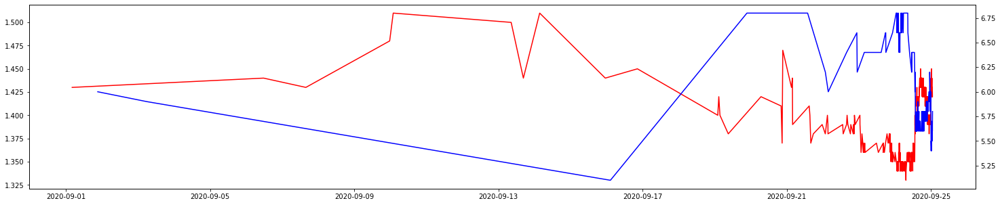

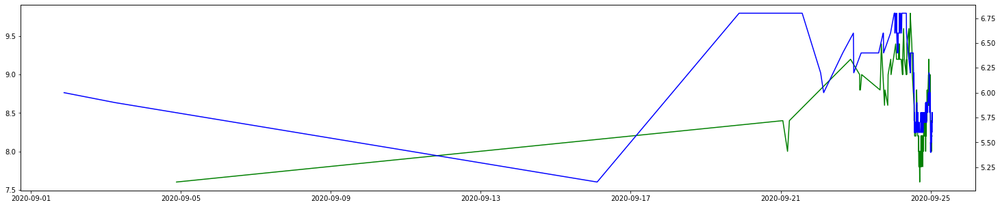

In [10]:
df_h=bf_home.loc[(bf_home['eventId']==id) & (bf_home['ip']==0)]
df_d=bf_draw.loc[(bf_draw['eventId']==id) & (bf_draw['ip']==0)]
df_a=bf_away.loc[(bf_away['eventId']==id) & (bf_away['ip']==0)]

f, ax = plt.subplots(figsize=(WIDE_GRAPH_WIDTH,WIDE_GRAPH_HEIGTH))
ax.plot("clk", "ltp", '-r', data=df_h)
ax2 = ax.twinx()
ax2.plot("clk", "ltp", '-b', data=df_d);

f, ax = plt.subplots(figsize=(WIDE_GRAPH_WIDTH,WIDE_GRAPH_HEIGTH))
ax.plot("clk", "ltp", '-g', data=df_a)
ax2 = ax.twinx()
ax2.plot("clk", "ltp", '-b', data=df_d);

### Explore totals by eventId

In [11]:
DROP_TIME_BEFORE_IP=48
def dropout_surplus(df):
    df=df.merge(df_matches[['eventId', 'inplayTime', 'halfTime']], on='eventId', how='left')

    # Remove corrupted values, where 1 half is longer then 1 hour
    df=df.loc[(df.halfTime-df.inplayTime).dt.seconds//3600<1]

    # Only DROP_TIME_BEFORE_IP hours before start are interesting
    df=df.loc[df['clk']>=df['inplayTime']-timedelta(hours=DROP_TIME_BEFORE_IP)]

    # First 45 minutes are interested in 1st and 2nd half
    df=df.loc[df['clk']<=df['halfTime']+timedelta(minutes=45)]

    # Mark inplay as 1st and 2nd halves
    df.loc[(df['ip']==1) & (df['clk']>df['halfTime']), 'ip']=2
    
    return df

bf_home=dropout_surplus(bf_home)
bf_draw=dropout_surplus(bf_draw)
bf_away=dropout_surplus(bf_away)

In [12]:
def get_info(df, ip=0):
    a=df.loc[df['ip']==ip].groupby('eventId')['ltp'].count()
    b=df.loc[df['ip']==ip].groupby('eventId')['ltp'].min()
    c=df.loc[df['ip']==ip].groupby('eventId')['ltp'].max()
    res=pd.concat([a,b,c],axis=1)
    res.columns=['count','odds_low','odds_high']
    res.reset_index(inplace=True)
    tmp=df.loc[df['ip']==ip].sort_values(by=['clk']).drop_duplicates(subset=['eventId'], keep='first').sort_values(by=['eventId'])
    tmp.columns=['eventId','ts','odds_open','ip', 'inplayTime', 'halfTime']
    res=res.merge(tmp[['eventId','ts','odds_open']], on='eventId', how='inner')
    tmp=df.loc[df['ip']==ip].sort_values(by=['clk'], ascending=False).drop_duplicates(subset=['eventId'], keep='first').sort_values(by=['eventId'])
    tmp.columns=['eventId','te','odds_close','ip', 'inplayTime', 'halfTime']
    res=res.merge(tmp[['eventId','te','odds_close']], on='eventId', how='inner')
    res['dur']=(res['te']-res['ts']).dt.seconds // 60
    return res


In [13]:
df_info_home=get_info(bf_home, ip=0)
df_info_draw=get_info(bf_draw, ip=0)
df_info_away=get_info(bf_away, ip=0)

display(df_info_home.describe())
display(df_info_draw.describe())
display(df_info_away.describe())

,eventId,count,odds_low,odds_high,odds_open,odds_close,dur
count,5.124300e+04,51243.000000,51243.000000,51243.000000,51243.000000,51243.000000,51243.000000
mean,2.855158e+07,68.450520,2.635804,3.302785,2.862106,2.943215,973.738150
std,7.145919e+05,74.909512,2.645145,10.917716,5.643247,4.537594,433.720836
min,2.742581e+07,1.000000,1.010000,1.040000,1.020000,1.020000,0.000000
25%,2.794431e+07,22.000000,1.700000,1.880000,1.790000,1.780000,619.000000
50%,2.851007e+07,42.000000,2.140000,2.400000,2.260000,2.280000,1145.000000
75%,2.911241e+07,85.000000,2.780000,3.200000,2.920000,3.000000,1348.000000
max,3.009576e+07,890.000000,250.000000,1000.000000,930.000000,420.000000,1439.000000


,eventId,count,odds_low,odds_high,odds_open,odds_close,dur
count,5.115700e+04,51157.000000,51157.000000,51157.000000,51157.000000,51157.000000,51157.000000
mean,2.855148e+07,38.967199,3.905753,4.527256,4.135008,4.197057,894.865688
std,7.147359e+05,41.471754,4.227399,9.333095,6.226596,4.422827,447.023105
min,2.742581e+07,1.000000,1.010000,1.630000,1.530000,1.400000,0.000000
25%,2.794366e+07,15.000000,3.300000,3.550000,3.400000,3.400000,502.000000
50%,2.850551e+07,26.000000,3.550000,3.850000,3.700000,3.700000,1028.000000
75%,2.911176e+07,47.000000,3.950000,4.500000,4.200000,4.200000,1301.000000
max,3.009576e+07,598.000000,910.000000,1000.000000,1000.000000,910.000000,1439.000000


,eventId,count,odds_low,odds_high,odds_open,odds_close,dur
count,5.119600e+04,51196.000000,51196.000000,51196.000000,51196.000000,51196.000000,51196.000000
mean,2.855144e+07,54.530256,4.493655,5.864029,4.985986,5.168471,936.278850
std,7.145689e+05,66.566006,4.380853,11.405999,5.967410,6.628815,440.725484
min,2.742581e+07,1.000000,1.010000,1.030000,1.010000,1.010000,0.000000
25%,2.794368e+07,17.000000,2.520000,2.880000,2.700000,2.680000,561.000000
50%,2.850787e+07,32.000000,3.400000,3.950000,3.650000,3.700000,1090.000000
75%,2.911240e+07,63.000000,4.900000,6.000000,5.400000,5.500000,1327.000000
max,3.009576e+07,779.000000,380.000000,910.000000,590.000000,640.000000,1439.000000


Wow, most of matches have lack of data. I decide to filter out matches with exposition less then 12 hours and first 75% by count.

In [14]:
df_info_home=df_info_home.loc[(df_info_home['count']>=df_info_home.describe().loc['75%','count']) & (df_info_home['dur']>=720)]
df_info_draw=df_info_draw.loc[(df_info_draw['count']>=df_info_draw.describe().loc['75%','count']) & (df_info_draw['dur']>=720)]
df_info_away=df_info_away.loc[(df_info_away['count']>=df_info_away.describe().loc['75%','count']) & (df_info_away['dur']>=720)]

display(df_info_home.describe())
display(df_info_draw.describe())
display(df_info_away.describe())

,eventId,count,odds_low,odds_high,odds_open,odds_close,dur
count,1.173900e+04,11739.000000,11739.000000,11739.000000,11739.000000,11739.000000,11739.000000
mean,2.855695e+07,173.742142,2.325390,3.026998,2.514835,2.565937,1317.653974
std,7.267044e+05,88.855988,1.831247,16.389087,2.177376,3.567447,144.412333
min,2.742581e+07,85.000000,1.030000,1.060000,1.040000,1.040000,720.000000
25%,2.795755e+07,108.000000,1.500000,1.650000,1.580000,1.560000,1281.000000
50%,2.848738e+07,144.000000,1.840000,2.060000,1.950000,1.940000,1371.000000
75%,2.911249e+07,213.000000,2.380000,2.700000,2.520000,2.540000,1415.000000
max,3.008940e+07,890.000000,38.000000,1000.000000,46.000000,290.000000,1439.000000


,eventId,count,odds_low,odds_high,odds_open,odds_close,dur
count,1.091900e+04,10919.000000,10919.000000,10919.000000,10919.000000,10919.000000,10919.000000
mean,2.855758e+07,94.973899,4.084469,4.872751,4.357243,4.403265,1277.635131
std,7.401849e+05,55.605722,1.534642,12.992126,1.773688,2.017200,164.267340
min,2.742581e+07,47.000000,1.320000,1.630000,1.530000,1.400000,720.000000
25%,2.794324e+07,58.000000,3.350000,3.600000,3.450000,3.450000,1214.000000
50%,2.848867e+07,77.000000,3.600000,3.950000,3.750000,3.750000,1333.000000
75%,2.911701e+07,111.500000,4.200000,4.900000,4.500000,4.500000,1400.000000
max,3.009069e+07,598.000000,24.000000,950.000000,29.000000,44.000000,1439.000000


,eventId,count,odds_low,odds_high,odds_open,odds_close,dur
count,1.148500e+04,11485.000000,11485.000000,11485.000000,11485.000000,11485.000000,11485.000000
mean,2.857288e+07,144.040575,4.230977,5.495045,4.775779,4.873178,1302.604179
std,7.383588e+05,89.281316,4.583718,7.845633,5.764597,6.342531,151.703236
min,2.742581e+07,63.000000,1.020000,1.040000,1.020000,1.020000,720.000000
25%,2.795751e+07,81.000000,1.930000,2.200000,2.060000,2.040000,1257.000000
50%,2.851188e+07,111.000000,2.760000,3.200000,2.980000,2.960000,1357.000000
75%,2.913657e+07,177.000000,4.700000,5.800000,5.200000,5.200000,1410.000000
max,3.009071e+07,779.000000,90.000000,260.000000,130.000000,190.000000,1439.000000


df_info_home=df_info_home.loc[(df_info_home['count']>=df_info_home.describe().loc['75%','count'])]
df_info_draw=df_info_draw.loc[(df_info_draw['count']>=df_info_draw.describe().loc['75%','count'])]
df_info_away=df_info_away.loc[(df_info_away['count']>=df_info_away.describe().loc['75%','count'])]

display(df_info_home.describe())
display(df_info_draw.describe())
display(df_info_away.describe())

Ok, there are 10k+ matches in each category. Let's filter everything to them and look info again.

In [15]:
evids_home=df_info_home['eventId'].unique()
evids_draw=df_info_draw['eventId'].unique()
evids_away=df_info_away['eventId'].unique()

bf_home=bf_home.loc[(bf_home['eventId'].isin(evids_home)) & (bf_home['eventId'].isin(evids_draw)) & (bf_home['eventId'].isin(evids_away))]
bf_draw=bf_draw.loc[(bf_draw['eventId'].isin(evids_home)) & (bf_draw['eventId'].isin(evids_draw)) & (bf_draw['eventId'].isin(evids_away))]
bf_away=bf_away.loc[(bf_away['eventId'].isin(evids_home)) & (bf_away['eventId'].isin(evids_draw)) & (bf_away['eventId'].isin(evids_away))]
print('Matches: {}, Home: {}, Draw: {}, Away: {}'.format(len(df_matches.index),len(bf_home.index),len(bf_draw.index),len(bf_away.index)))

Matches: 264390, Home: 1413897, Draw: 857878, Away: 1198644


In [16]:
df_info_home=get_info(bf_home, ip=0)
df_info_draw=get_info(bf_draw, ip=0)
df_info_away=get_info(bf_away, ip=0)

display(df_info_home.describe())
display(df_info_draw.describe())
display(df_info_away.describe())

,eventId,count,odds_low,odds_high,odds_open,odds_close,dur
count,5.723000e+03,5723.000000,5723.000000,5723.000000,5723.000000,5723.000000,5723.000000
mean,2.857422e+07,216.093657,2.766421,3.738052,3.011503,3.120344,1356.327276
std,7.361831e+05,102.011431,2.343795,19.330114,2.788160,4.867065,107.235784
min,2.742581e+07,85.000000,1.040000,1.060000,1.040000,1.040000,720.000000
25%,2.797347e+07,135.000000,1.540000,1.680000,1.610000,1.600000,1335.000000
50%,2.850283e+07,196.000000,2.040000,2.280000,2.160000,2.160000,1394.000000
75%,2.913694e+07,274.000000,2.900000,3.350000,3.050000,3.150000,1421.000000
max,3.008880e+07,890.000000,38.000000,1000.000000,46.000000,290.000000,1439.000000


,eventId,count,odds_low,odds_high,odds_open,odds_close,dur
count,5.723000e+03,5723.000000,5723.000000,5723.000000,5723.000000,5723.000000,5723.000000
mean,2.857422e+07,118.527346,4.300748,4.978174,4.596960,4.660748,1314.528569
std,7.361831e+05,64.476328,1.715269,2.551055,1.979444,2.275212,138.142219
min,2.742581e+07,47.000000,1.830000,2.640000,1.900000,2.120000,723.000000
25%,2.797347e+07,74.000000,3.400000,3.700000,3.550000,3.500000,1274.000000
50%,2.850283e+07,102.000000,3.700000,4.100000,3.900000,3.900000,1363.000000
75%,2.913694e+07,142.000000,4.500000,5.200000,4.900000,4.900000,1411.000000
max,3.008880e+07,598.000000,24.000000,44.000000,29.000000,44.000000,1439.000000


,eventId,count,odds_low,odds_high,odds_open,odds_close,dur
count,5.723000e+03,5723.000000,5723.000000,5723.000000,5723.000000,5723.000000,5723.000000
mean,2.857422e+07,177.653503,5.278504,6.862792,5.981800,6.104999,1336.745239
std,7.361831e+05,104.700642,5.174066,8.198357,6.493953,6.928781,124.987340
min,2.742581e+07,63.000000,1.050000,1.090000,1.090000,1.070000,723.000000
25%,2.797347e+07,96.000000,2.400000,2.720000,2.580000,2.540000,1309.000000
50%,2.850283e+07,146.000000,3.600000,4.300000,3.900000,3.950000,1382.000000
75%,2.913694e+07,233.000000,6.000000,7.600000,6.800000,6.800000,1418.000000
max,3.008880e+07,779.000000,80.000000,130.000000,130.000000,100.000000,1439.000000


Ok, 4500 matches and all of them have enough data to make analysis.  Also, these are big, popular matches. Now I want to mark halfs in inplay odds, and make expositions equal for all matches.

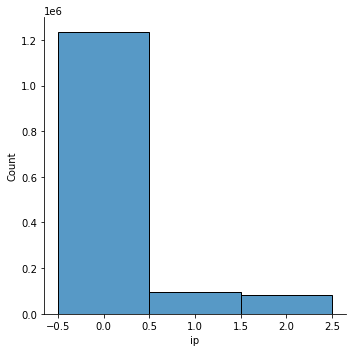

In [17]:
sns.displot(bf_home, x="ip", discrete=True);

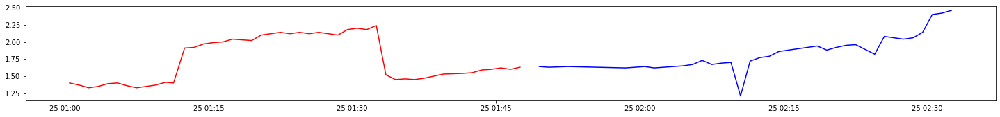

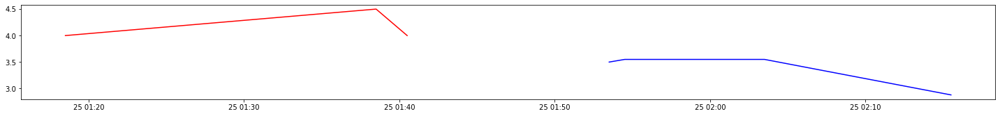

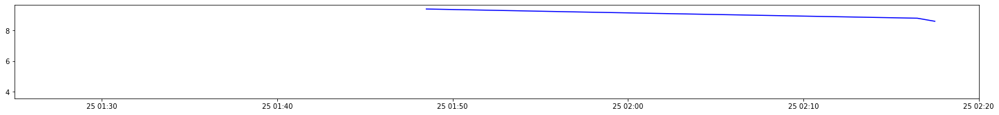

In [18]:
#id=bf_home.iloc[0]['eventId']

df_tmp=bf_home.loc[(bf_home['eventId']==id)]
f, ax = plt.subplots(figsize=(WIDE_GRAPH_WIDTH,WIDE_GRAPH_HEIGTH/2))
ax.plot("clk", "ltp", '-r', data=df_tmp[df_tmp['ip']==1]);
ax.plot("clk", "ltp", '-b', data=df_tmp[df_tmp['ip']==2]);

df_tmp=bf_draw.loc[(bf_draw['eventId']==id)]
f, ax = plt.subplots(figsize=(WIDE_GRAPH_WIDTH,WIDE_GRAPH_HEIGTH/2))
ax.plot("clk", "ltp", '-r', data=df_tmp[df_tmp['ip']==1]);
ax.plot("clk", "ltp", '-b', data=df_tmp[df_tmp['ip']==2]);

df_tmp=bf_away.loc[(bf_away['eventId']==id)]
f, ax = plt.subplots(figsize=(WIDE_GRAPH_WIDTH,WIDE_GRAPH_HEIGTH/2))
ax.plot("clk", "ltp", '-r', data=df_tmp[df_tmp['ip']==1]);
ax.plot("clk", "ltp", '-b', data=df_tmp[df_tmp['ip']==2]);

### Prepare data 
I want to align data, fill gaps and make every time serie equal. The idea here to make 1 minute averages for all data, and fill odds gaps with previous values. 

Remember last info tables, more then 75% matches don't have bids before twenty-four hours to inplay time. So, it is worth to cut non-inplay timeseries to last 1440 minutes. Also, cut data to first 45 minutes of 1st half, and first 30 min of 2nd half.

The 1440 values is too many for my slow machine, and there are mean around 200 bids on this period. I think it's ok to calc 5-min averages for non-inplay data.

In [19]:
TO0=1440 // 5
TO1=45
TO2=30

def convert_to_ts(df, ti0='1min'):
    cols=['eventId', 'clk', 'ltp', 'ip', 'c']
    df=df.set_index(["clk"]).sort_index()                                               # Index should be a datetime for the resample
    res0=df[df['ip']==0].groupby("eventId")[['ltp','ip']].resample(ti0).mean().reset_index()   # Calculate 1-minute averages
    res1=df[df['ip']==1].groupby("eventId")[['ltp','ip']].resample('1min').mean().reset_index()#
    res2=df[df['ip']==2].groupby("eventId")[['ltp','ip']].resample('1min').mean().reset_index()#
    res=pd.concat([res0,res1,res2], axis=0)                                             #
    res['ip']=res['ip'].apply(lambda x: math.ceil(x) if x>0 else x)                     # Simple way to keep inplay classes
    res['c']=res.groupby('eventId')['clk'].cumcount()                                   # "Observation" number
    res=res.fillna(method='ffill')                                                      # Fill gaps
    res=res[cols]

    lasts=res.drop_duplicates(subset=['eventId','ip'], keep='last')                     # To make calculations faster get last items for every match and ip flag
    res=res.merge(lasts[lasts['ip']==0][['eventId','c']], on='eventId', how='left')     # add last c for each ip flag to the right
    res=res.merge(lasts[lasts['ip']==1][['eventId','c']], on='eventId', how='left')     # add last c for each ip flag to the right
    res=res.merge(lasts[lasts['ip']==2][['eventId','c']], on='eventId', how='left')     # add last c for each ip flag to the right
    res.columns=['eventId', 'clk', 'ltp', 'ip', 'c', 'c0', 'c1', 'c2']                  # 
    res.loc[res['ip']==0, 'c']=res['c0']-res['c']                                       # Subtract current c from maximum (last) c, it just reverse the order,so the last c became 0.
    res.loc[res['ip']==1, 'c']=res['c']-res['c0']                                       # Subtract maximum (last) c from the current c, so c starts from 0.
    res.loc[res['ip']==2, 'c']=res['c']-res['c1']                                       #
    res=res[cols]                                                                       # 
    res=res.loc[~((res['ip']==0) & (res['c']>=TO0))]
    res=res.loc[~((res['ip']==1) & (res['c']>TO1))]
    res=res.loc[~((res['ip']==2) & (res['c']>TO2))]
    res=res.loc[res['c']>0]
    print('Final TS lengths:  {} for non-inplay, {} in 1st half, {} in 2nd half.'.format(res[res['ip']==0].c.max(),res[res['ip']==1].c.max(),res[res['ip']==2].c.max()))
    return res

ts_home=convert_to_ts(bf_home, ti0='5min')
ts_draw=convert_to_ts(bf_draw, ti0='5min')
ts_away=convert_to_ts(bf_away, ti0='5min')

Final TS lengths:  287.0 for non-inplay, 45.0 in 1st half, 30.0 in 2nd half.
Final TS lengths:  287.0 for non-inplay, 45.0 in 1st half, 30.0 in 2nd half.
Final TS lengths:  287.0 for non-inplay, 45.0 in 1st half, 30.0 in 2nd half.


In [26]:
home_odds_first=bf_home.sort_values(by='clk', ascending=True).drop_duplicates(subset=['eventId','ip'], keep='first')
draw_odds_first=bf_draw.sort_values(by='clk', ascending=True).drop_duplicates(subset=['eventId','ip'], keep='first')
away_odds_first=bf_away.sort_values(by='clk', ascending=True).drop_duplicates(subset=['eventId','ip'], keep='first')

home_odds_last=bf_home.sort_values(by='clk', ascending=True).drop_duplicates(subset=['eventId','ip'], keep='last')
draw_odds_last=bf_draw.sort_values(by='clk', ascending=True).drop_duplicates(subset=['eventId','ip'], keep='last')
away_odds_last=bf_away.sort_values(by='clk', ascending=True).drop_duplicates(subset=['eventId','ip'], keep='last')

Well, time to transpose data horizontally.

In [20]:
# Transpose time series
def transpose_ts(df):
    #res=res.dropna()
    res0=df[df['ip']==0].pivot(index='eventId', columns='c', values='ltp').add_prefix('M').reset_index()
    res1=df[df['ip']==1].pivot(index='eventId', columns='c', values='ltp').add_prefix('M').reset_index()
    res2=df[df['ip']==2].drop_duplicates(subset=['eventId','c'])
    res2=res2[res2['ip']==2].pivot(index='eventId', columns='c', values='ltp').add_prefix('M').reset_index()
    # 1 is the minimum possible odds value
    res0=res0.fillna(1)
    res1=res1.fillna(1)
    res2=res2.fillna(1)
    return res0,res1,res2

ts_home0,ts_home1,ts_home2 = transpose_ts(ts_home)
ts_draw0,ts_draw1,ts_draw2 = transpose_ts(ts_draw)
ts_away0,ts_away1,ts_away2 = transpose_ts(ts_away)

## Time series clasterization

In [32]:
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [30]:
def plot_cluster_tickers(current_cluster, to):
    fig, ax = plt.subplots(
        int(np.ceil(current_cluster.shape[0]/4)),
        4,
        figsize=(15, 3*int(np.ceil(current_cluster.shape[0]/4)))
    )
    fig.autofmt_xdate(rotation=45)
    ax = ax.reshape(-1)

    for index, (_, row) in enumerate(current_cluster.iterrows()):
        ax[index].plot(row.iloc[1:to])
        ax[index].set_title(f"{row.eventId}")
        plt.xticks(rotation=45)
        if index==11:
            break

    plt.tight_layout()
    plt.show()

def find_kmeans(df_scaled):
    distortions = []
    silhouette = []
    daviesbouldin = []
    K = range(1, 10)
    for k in tqdm(K):
        kmeanModel = TimeSeriesKMeans(n_clusters=k, metric="euclidean", n_jobs=6, max_iter=10)
        kmeanModel.fit(df_scaled)
        distortions.append(kmeanModel.inertia_)
        if k > 1:
            silhouette.append(silhouette_score(df_scaled, kmeanModel.labels_))
            daviesbouldin.append(davies_bouldin_score(df_scaled, kmeanModel.labels_))

    plt.figure(figsize=(10,4))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    plt.show()

    plt.figure(figsize=(10,4))
    plt.plot(K[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette')
    plt.show()

    plt.figure(figsize=(10,4))
    plt.plot(K[1:], daviesbouldin, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Davies-Bouldin score')
    plt.title('Davies-Bouldin')
    plt.show()

def calc_kmeans(df_scaled, n_clusters):
    ts_kmeans = TimeSeriesKMeans(n_clusters=n_clusters, metric="euclidean", n_jobs=6, max_iter=10)
    ts_kmeans.fit(df_scaled)

    for cluster_number in range(n_clusters):
        plt.plot(ts_kmeans.cluster_centers_[cluster_number, :, 0].T, label=cluster_number)
    plt.title("Cluster centroids")
    plt.legend()
    plt.show()
    return ts_kmeans

def draw_examples(df, df_scaled, ts_kmeans, n_clusters, w):
    df['cluster'] = ts_kmeans.predict(df_scaled)
    for cluster in range(n_clusters):
        print("=================================================================================")
        print(f"                          Cluster number: {cluster}")
        print("=================================================================================")
        plot_cluster_tickers(df[df.cluster==cluster].head(12), w)

In [28]:
scaler = StandardScaler()
df_scaled_home_0 = np.fliplr(scaler.fit_transform(ts_home0.iloc[:, 1:TO0+1].T).T)
df_scaled_draw_0 = np.fliplr(scaler.fit_transform(ts_draw0.iloc[:, 1:TO0+1].T).T)
df_scaled_away_0 = np.fliplr(scaler.fit_transform(ts_away0.iloc[:, 1:TO0+1].T).T)

df_scaled_home_1 = scaler.fit_transform(ts_home1.iloc[:, 1:TO1+1].T).T
df_scaled_draw_1 = scaler.fit_transform(ts_draw1.iloc[:, 1:TO1+1].T).T
df_scaled_away_1 = scaler.fit_transform(ts_away1.iloc[:, 1:TO1+1].T).T

df_scaled_home_2 = scaler.fit_transform(ts_home2.iloc[:, 1:TO2+1].T).T
df_scaled_draw_2 = scaler.fit_transform(ts_draw2.iloc[:, 1:TO2+1].T).T
df_scaled_away_2 = scaler.fit_transform(ts_away2.iloc[:, 1:TO2+1].T).T

100%|██████████| 9/9 [02:42<00:00, 18.06s/it]


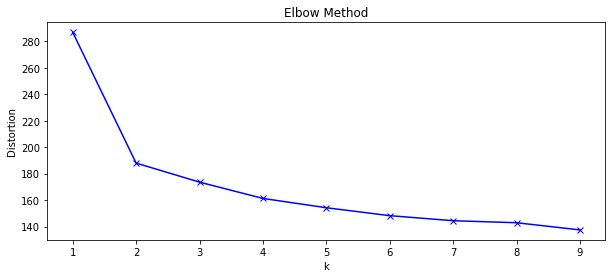

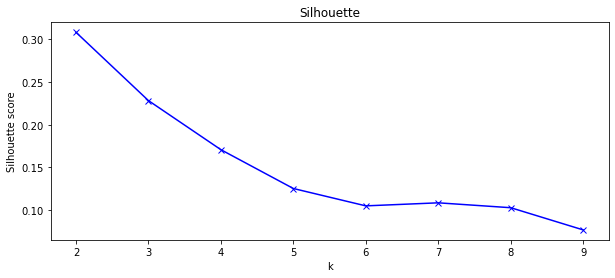

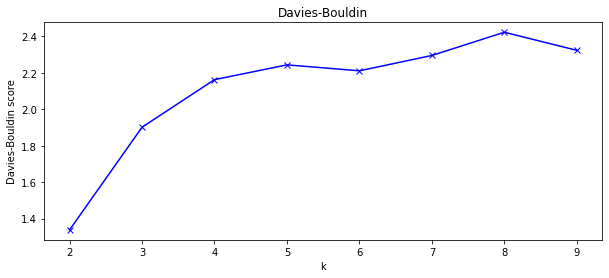

100%|██████████| 9/9 [02:28<00:00, 16.54s/it]


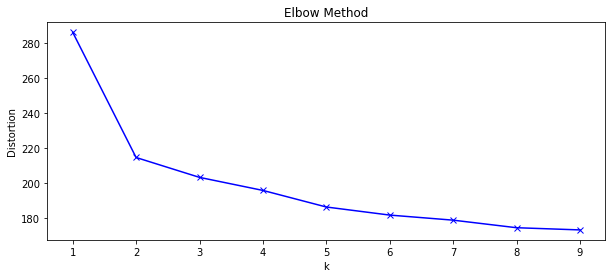

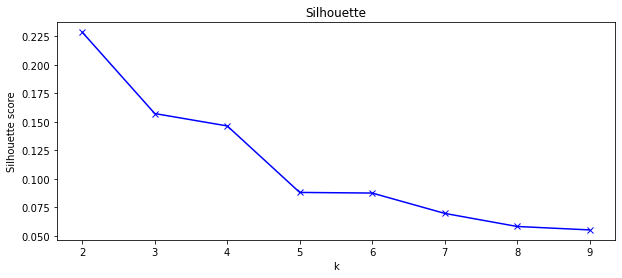

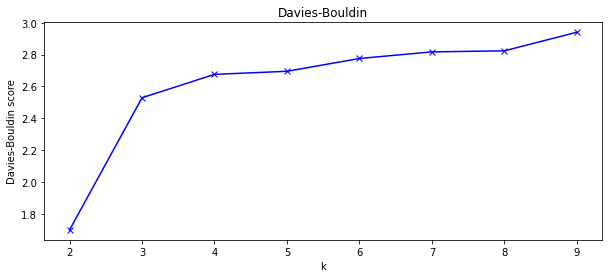

100%|██████████| 9/9 [02:32<00:00, 16.99s/it]


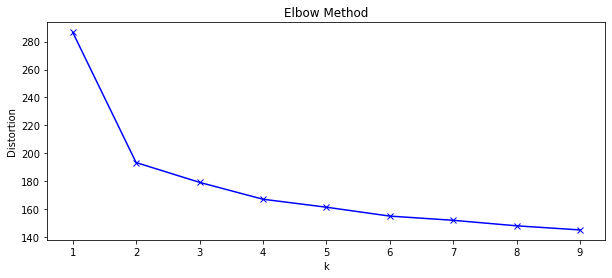

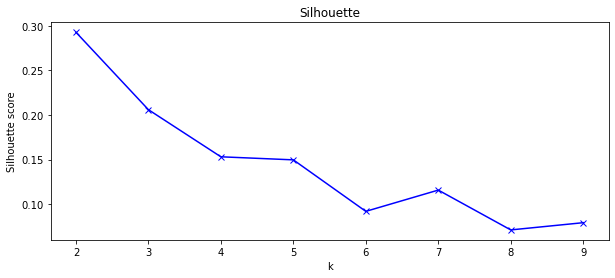

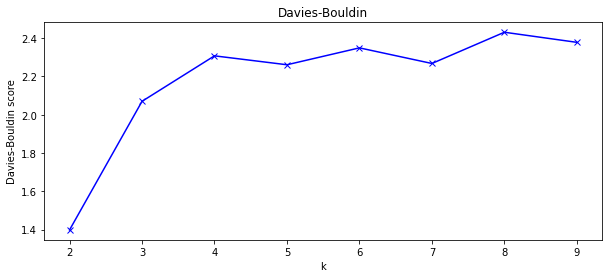

In [33]:
find_kmeans(df_scaled_home_0)
find_kmeans(df_scaled_draw_0)
find_kmeans(df_scaled_away_0)

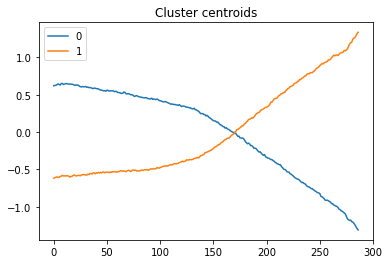

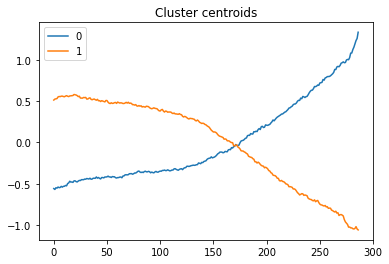

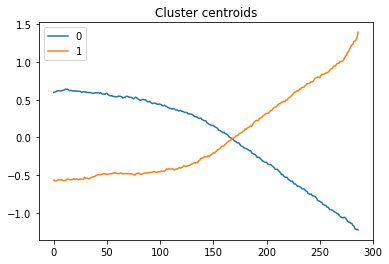

In [34]:
cl=2
ts_kmeans_home_0 = calc_kmeans(df_scaled_home_0, cl)
ts_kmeans_draw_0 = calc_kmeans(df_scaled_draw_0, cl)
ts_kmeans_away_0 = calc_kmeans(df_scaled_away_0, cl)

100%|██████████| 9/9 [00:23<00:00,  2.59s/it]


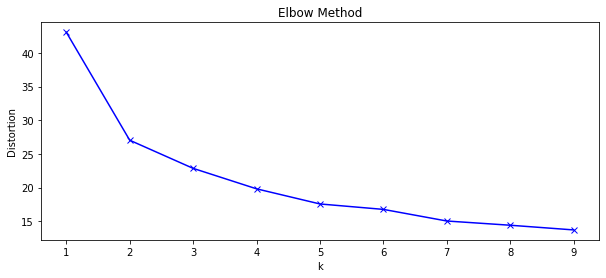

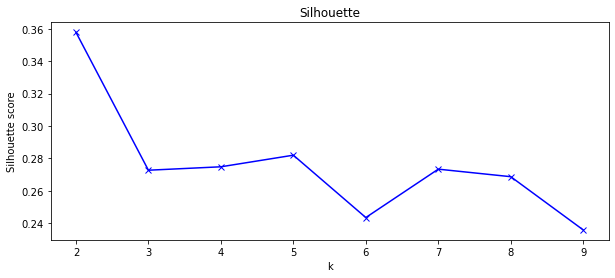

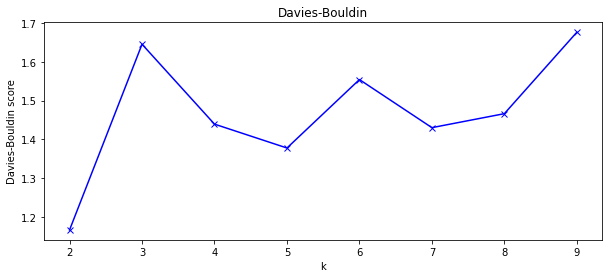

100%|██████████| 9/9 [00:23<00:00,  2.57s/it]


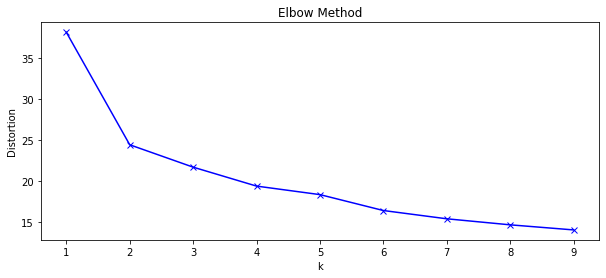

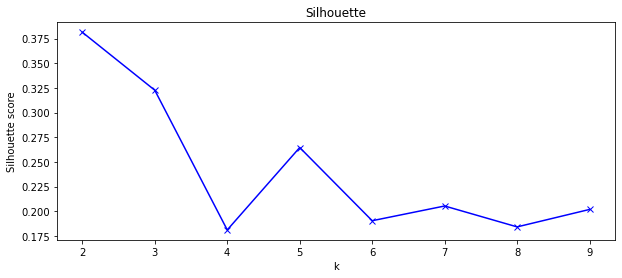

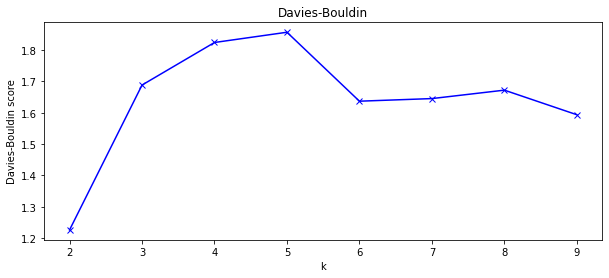

100%|██████████| 9/9 [00:23<00:00,  2.62s/it]


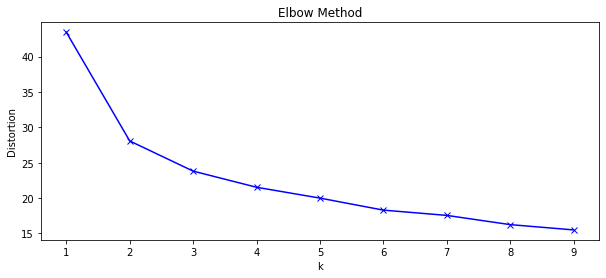

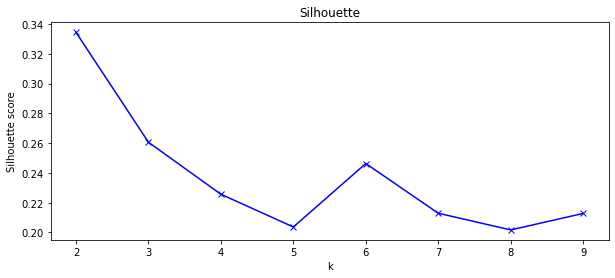

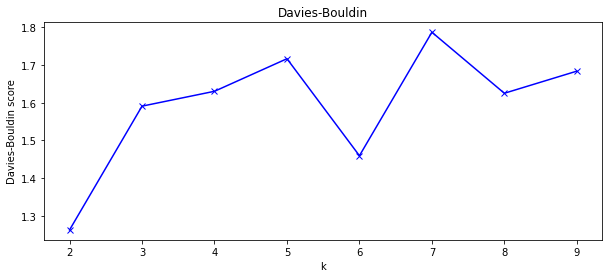

In [35]:
find_kmeans(df_scaled_home_1)
find_kmeans(df_scaled_draw_1)
find_kmeans(df_scaled_away_1)

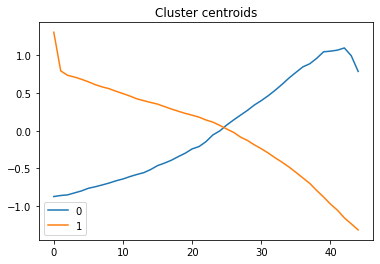

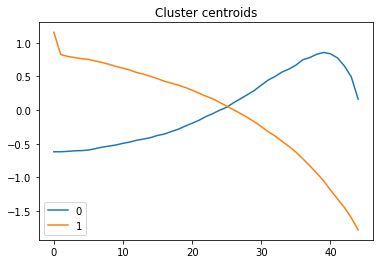

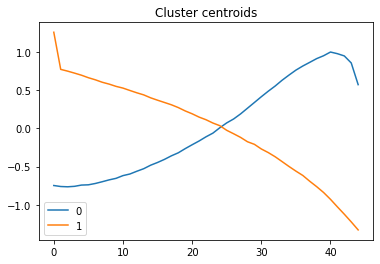

In [36]:
cl=2
ts_kmeans_home_1 = calc_kmeans(df_scaled_home_1, cl)
ts_kmeans_draw_1 = calc_kmeans(df_scaled_draw_1, cl)
ts_kmeans_away_1 = calc_kmeans(df_scaled_away_1, cl)

100%|██████████| 9/9 [00:21<00:00,  2.39s/it]


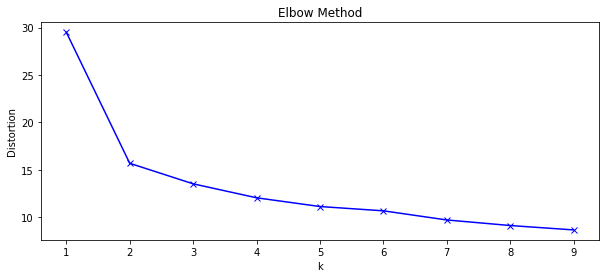

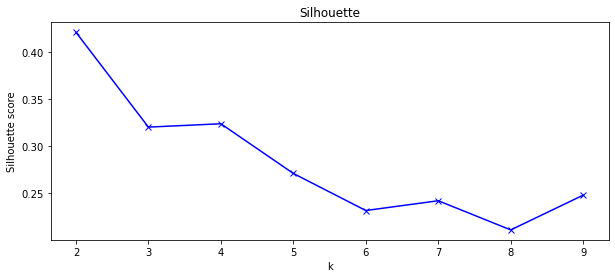

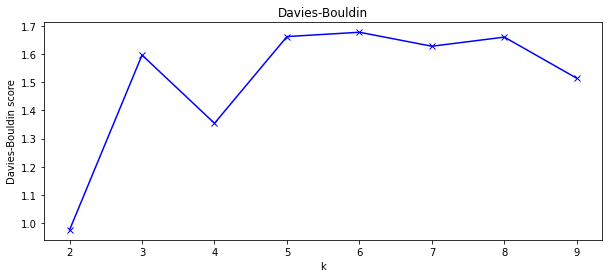

100%|██████████| 9/9 [00:23<00:00,  2.58s/it]


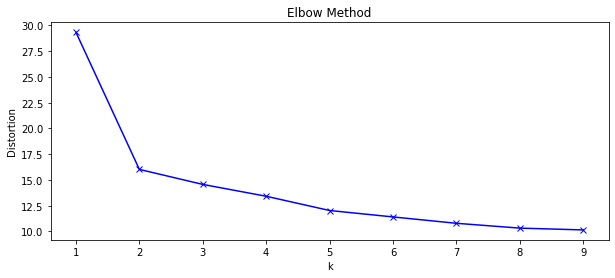

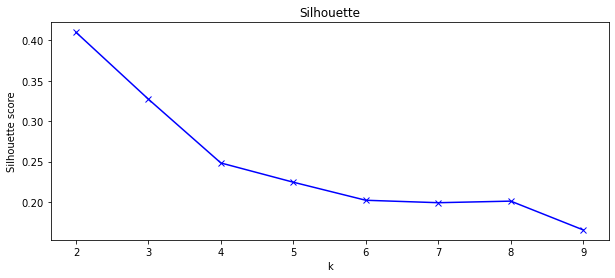

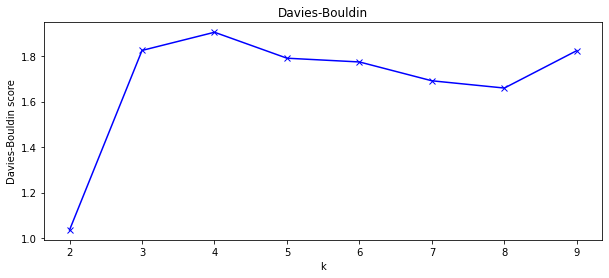

100%|██████████| 9/9 [00:21<00:00,  2.39s/it]


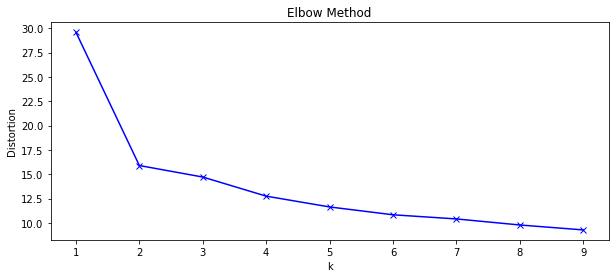

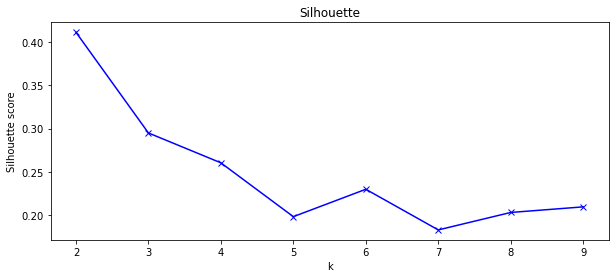

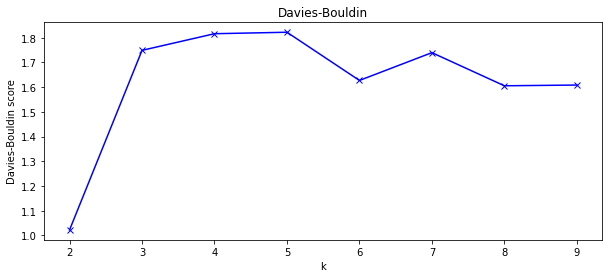

In [37]:
find_kmeans(df_scaled_home_2)
find_kmeans(df_scaled_draw_2)
find_kmeans(df_scaled_away_2)

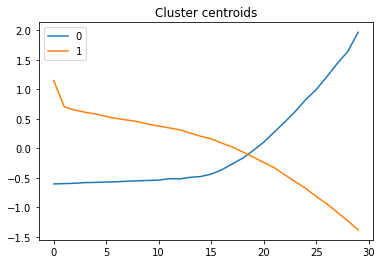

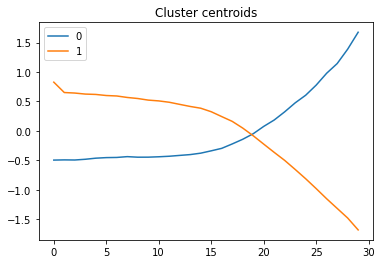

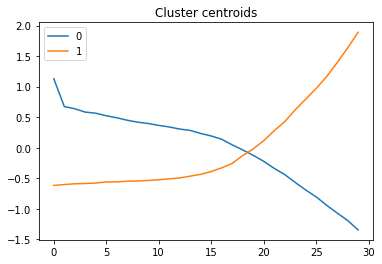

In [38]:
cl=2
ts_kmeans_home_2 = calc_kmeans(df_scaled_home_2, cl)
ts_kmeans_draw_2 = calc_kmeans(df_scaled_draw_2, cl)
ts_kmeans_away_2 = calc_kmeans(df_scaled_away_2, cl)

In [39]:
ts_home0.shape,ts_home1.shape,ts_home2.shape

((5723, 288), (5603, 46), (5394, 31))

In [79]:
pr=ts_kmeans_home_0.predict(df_scaled_home_0)

In [41]:
ts_home0['clh0'] = ts_kmeans_home_0.predict(df_scaled_home_0) # swich 'cause i want blues always go up
ts_home1['clh1'] = ts_kmeans_home_1.predict(df_scaled_home_1)
ts_home2['clh2'] = ts_kmeans_home_2.predict(df_scaled_home_2)

ts_draw0['cld0'] = ts_kmeans_draw_0.predict(df_scaled_draw_0) 
ts_draw1['cld1'] = ts_kmeans_draw_1.predict(df_scaled_draw_1)
ts_draw2['cld2'] = ts_kmeans_draw_2.predict(df_scaled_draw_2)

ts_away0['cla0'] = ts_kmeans_away_0.predict(df_scaled_away_0) # swich
ts_away1['cla1'] = ts_kmeans_away_1.predict(df_scaled_away_1)
ts_away2['cla2'] = ts_kmeans_away_2.predict(df_scaled_away_2) # swich

ts_home0['clh0']=1-ts_home0['clh0']
ts_away0['cla0']=1-ts_away0['cla0']
ts_away2['cla2']=1-ts_away2['cla2']

In [53]:
df=ts_home0[['eventId','clh0']]
df=df.merge(ts_home1[['eventId','clh1']], on='eventId')
df=df.merge(ts_home2[['eventId','clh2']], on='eventId')

df=df.merge(ts_draw0[['eventId','cld0']], on='eventId')
df=df.merge(ts_draw1[['eventId','cld1']], on='eventId')
df=df.merge(ts_draw2[['eventId','cld2']], on='eventId')

df=df.merge(ts_away0[['eventId','cla0']], on='eventId')
df=df.merge(ts_away1[['eventId','cla1']], on='eventId')
df=df.merge(ts_away2[['eventId','cla2']], on='eventId')

#df['cl0']=df['clh0'].astype(str)+df['cld0'].astype(str)+df['cla0'].astype(str)
#df['cl1']=df['clh1'].astype(str)+df['cld1'].astype(str)+df['cla1'].astype(str)
#df['cl2']=df['clh2'].astype(str)+df['cld2'].astype(str)+df['cla2'].astype(str)
df

c,eventId,clh0,clh1,clh2,cld0,cld1,cld2,cla0,cla1,cla2
0,27425811,1,1,0,0,0,1,0,1,1
1,27425812,1,1,1,0,1,1,0,0,0
2,27425816,0,1,1,1,1,1,1,1,0
3,27425818,0,1,1,0,0,1,1,1,1
4,27425819,1,1,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...
5101,30085846,1,1,0,0,1,1,0,1,1
5102,30086665,0,1,1,1,1,1,0,0,0
5103,30086667,1,1,1,0,1,1,0,1,1
5104,30086674,0,1,0,0,0,1,1,0,1


In [54]:
df = df.merge(home_odds_first.loc[home_odds_first['ip']==0][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "home_open_0"})
df = df.merge(home_odds_first.loc[home_odds_first['ip']==1][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "home_open_1"})
df = df.merge(home_odds_first.loc[home_odds_first['ip']==2][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "home_open_2"})

df = df.merge(draw_odds_first.loc[draw_odds_first['ip']==0][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "draw_open_0"})
df = df.merge(draw_odds_first.loc[draw_odds_first['ip']==1][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "draw_open_1"})
df = df.merge(draw_odds_first.loc[draw_odds_first['ip']==2][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "draw_open_2"})

df = df.merge(away_odds_first.loc[away_odds_first['ip']==0][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "away_open_0"})
df = df.merge(away_odds_first.loc[away_odds_first['ip']==1][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "away_open_1"})
df = df.merge(away_odds_first.loc[away_odds_first['ip']==2][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "away_open_2"})

df = df.merge(home_odds_last.loc[home_odds_last['ip']==0][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "home_close_0"})
df = df.merge(home_odds_last.loc[home_odds_last['ip']==1][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "home_close_1"})
df = df.merge(home_odds_last.loc[home_odds_last['ip']==2][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "home_close_2"})

df = df.merge(draw_odds_last.loc[draw_odds_last['ip']==0][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "draw_close_0"})
df = df.merge(draw_odds_last.loc[draw_odds_last['ip']==1][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "draw_close_1"})
df = df.merge(draw_odds_last.loc[draw_odds_last['ip']==2][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "draw_close_2"})

df = df.merge(away_odds_last.loc[away_odds_last['ip']==0][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "away_close_0"})
df = df.merge(away_odds_last.loc[away_odds_last['ip']==1][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "away_close_1"})
df = df.merge(away_odds_last.loc[away_odds_last['ip']==2][['eventId','ltp']], on='eventId', how='left')
df = df.rename(columns={"ltp": "away_close_2"})

df

,eventId,clh0,clh1,clh2,cld0,cld1,cld2,cla0,cla1,cla2,...,away_open_2,home_close_0,home_close_1,home_close_2,draw_close_0,draw_close_1,draw_close_2,away_close_0,away_close_1,away_close_2
0,27425811,1,1,0,0,0,1,0,1,1,...,1.47,3.30,9.40,42.00,3.90,4.60,5.40,2.22,1.48,1.29
1,27425812,1,1,1,0,1,1,0,0,0,...,44.00,1.33,1.47,1.14,5.60,3.50,9.80,13.00,46.00,150.00
2,27425816,0,1,1,1,1,1,1,1,0,...,10.00,1.39,1.51,1.68,5.30,3.15,3.00,10.50,9.60,1.82
3,27425818,0,1,1,0,0,1,1,1,1,...,1.05,5.60,17.50,400.00,3.80,130.00,70.00,1.76,1.01,1.02
4,27425819,1,1,1,0,0,0,0,0,1,...,75.00,1.91,1.09,1.01,3.75,16.00,510.00,4.80,70.00,1000.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5101,30085846,1,1,0,0,1,1,0,1,1,...,14.00,1.34,1.39,5.80,6.20,4.20,3.00,11.00,14.50,14.00
5102,30086665,0,1,1,1,1,1,0,0,0,...,4.20,2.98,3.35,3.40,3.05,2.38,1.59,2.90,4.10,6.60
5103,30086667,1,1,1,0,1,1,0,1,1,...,6.00,1.86,1.83,1.79,3.55,3.50,3.10,5.50,5.60,2.10
5104,30086674,0,1,0,0,0,1,1,0,1,...,34.00,3.20,1.14,1.35,3.40,10.50,4.10,2.56,30.00,13.00


In [55]:
df.to_csv('data/bf_classified_bin.csv', index=False)

                          Cluster number: 0


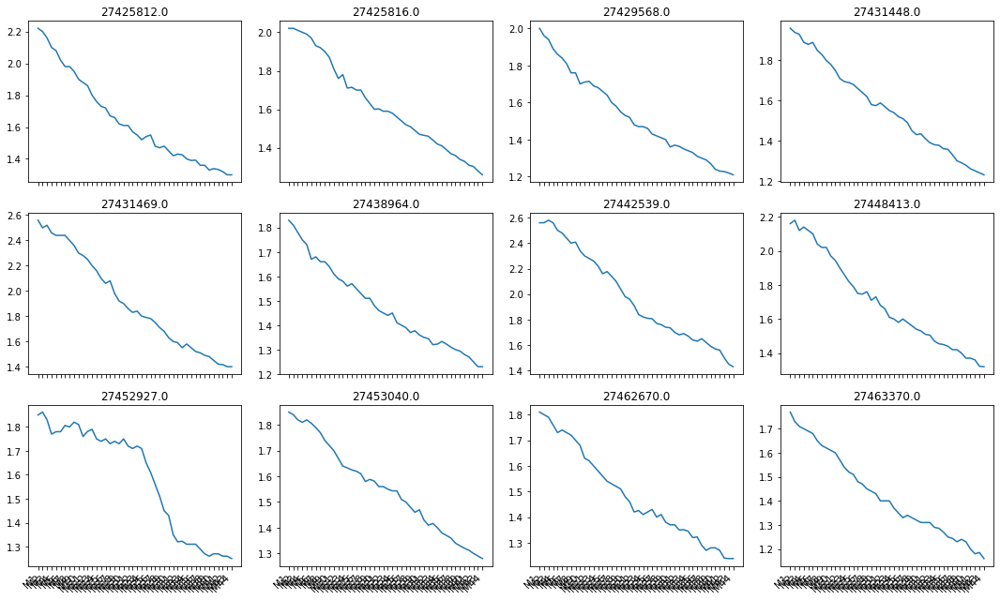

                          Cluster number: 1


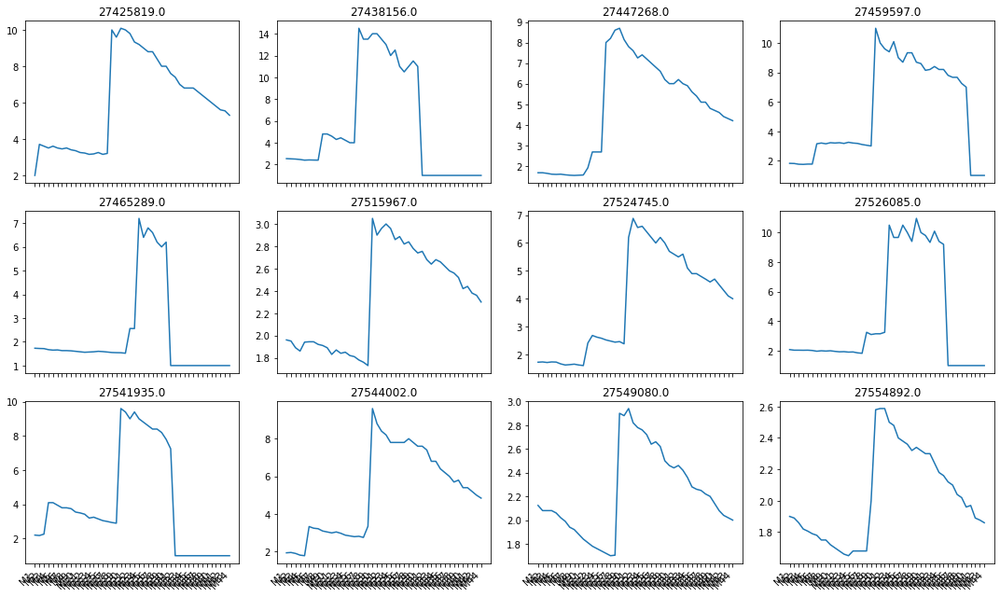

                          Cluster number: 2


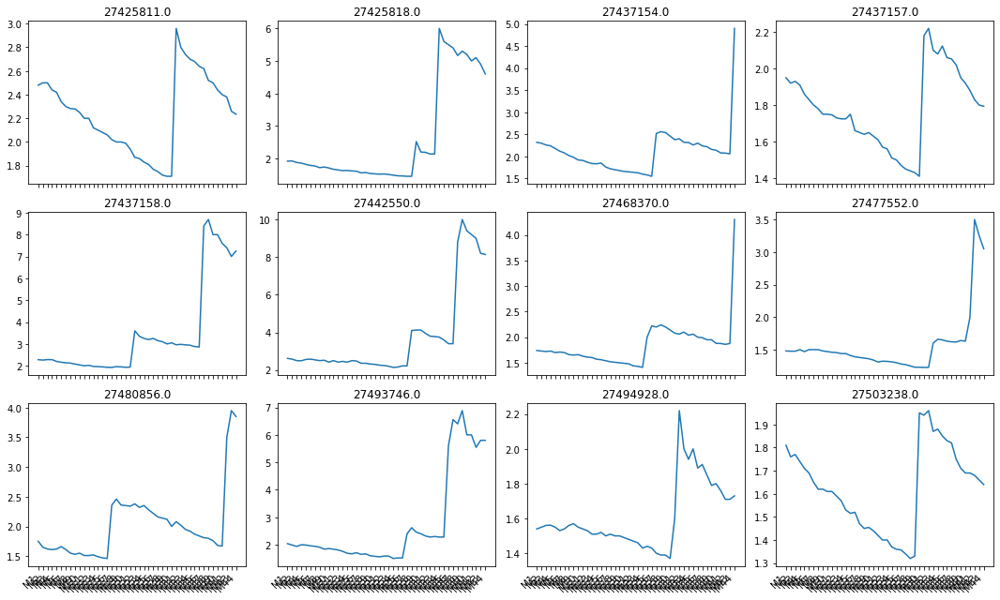

                          Cluster number: 3


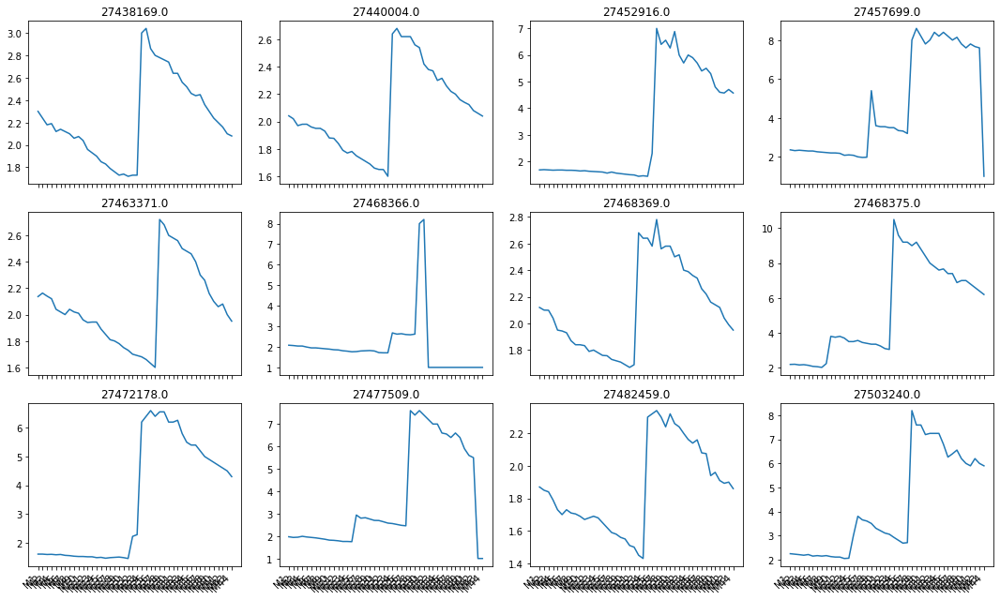

                          Cluster number: 4


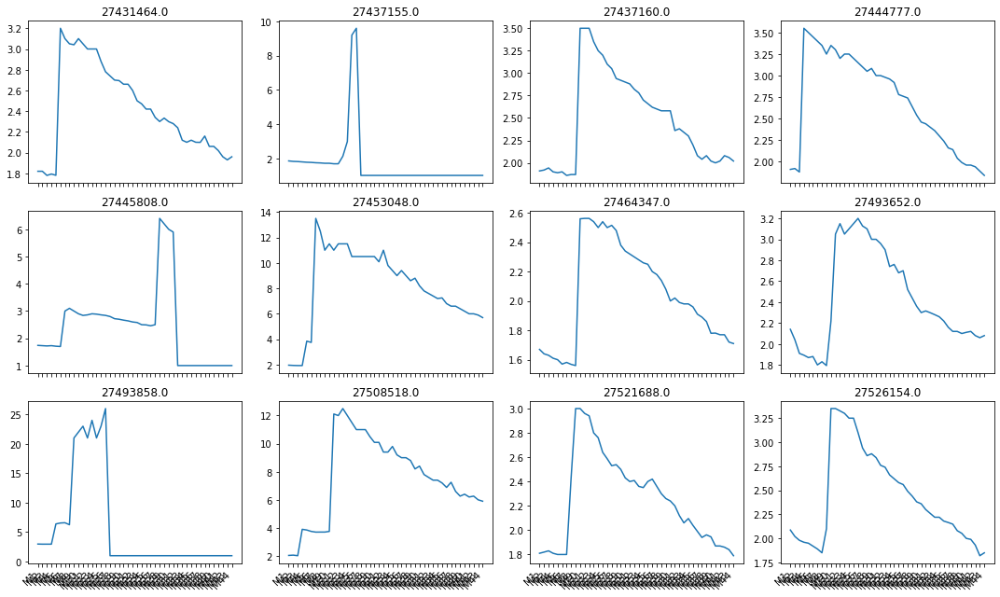

                          Cluster number: 5


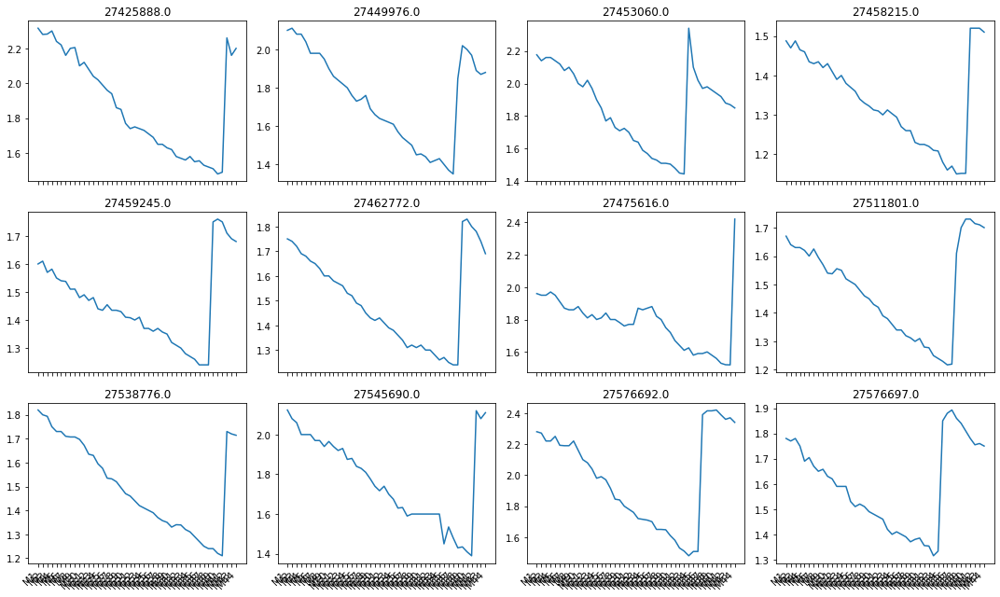

In [27]:
res1['cluster'] = ts_kmeans.predict(df_scaled)

for cluster in range(n_clusters):
    print("=================================================================================")
    print(f"                          Cluster number: {cluster}")
    print("=================================================================================")
    plot_cluster_tickers(res1[res1.cluster==cluster].head(12), TO1)

## DTW

100%|██████████| 5/5 [05:34<00:00, 66.91s/it]


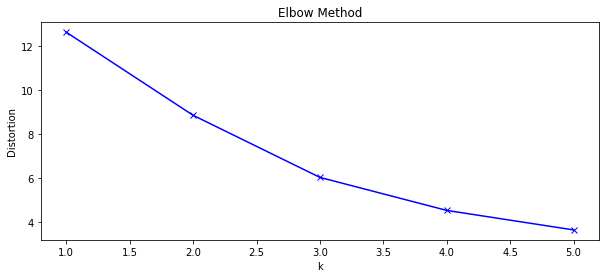

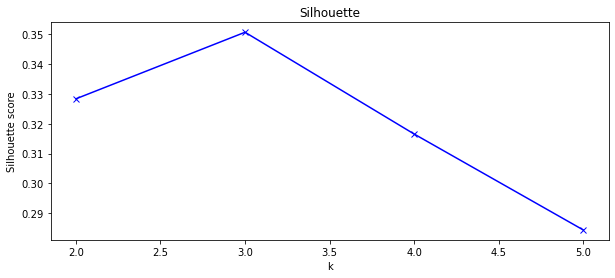

In [28]:
distortions = []
silhouette = []
K = range(1, 6)
for k in tqdm(K):
    kmeanModel = TimeSeriesKMeans(n_clusters=k, metric="dtw", n_jobs=20, max_iter=10, max_iter_barycenter=10)
    kmeanModel.fit(df_scaled)
    distortions.append(kmeanModel.inertia_)
    if k > 1:
        silhouette.append(silhouette_score(df_scaled, kmeanModel.labels_))

plt.figure(figsize=(10,4))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

plt.figure(figsize=(10,4))
plt.plot(K[1:], silhouette, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette score')
plt.title('Silhouette')
plt.show()

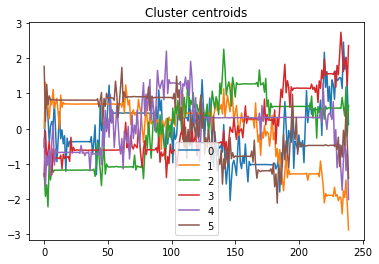

In [71]:
n_clusters = 6
ts_kmeans = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", n_jobs=6, max_iter=10, max_iter_barycenter=10)
ts_kmeans.fit(df_scaled)

for cluster_number in range(n_clusters):
    plt.plot(ts_kmeans.cluster_centers_[cluster_number, :, 0].T, label=cluster_number)
plt.title("Cluster centroids")
plt.legend()
plt.show()

                          Cluster number: 0


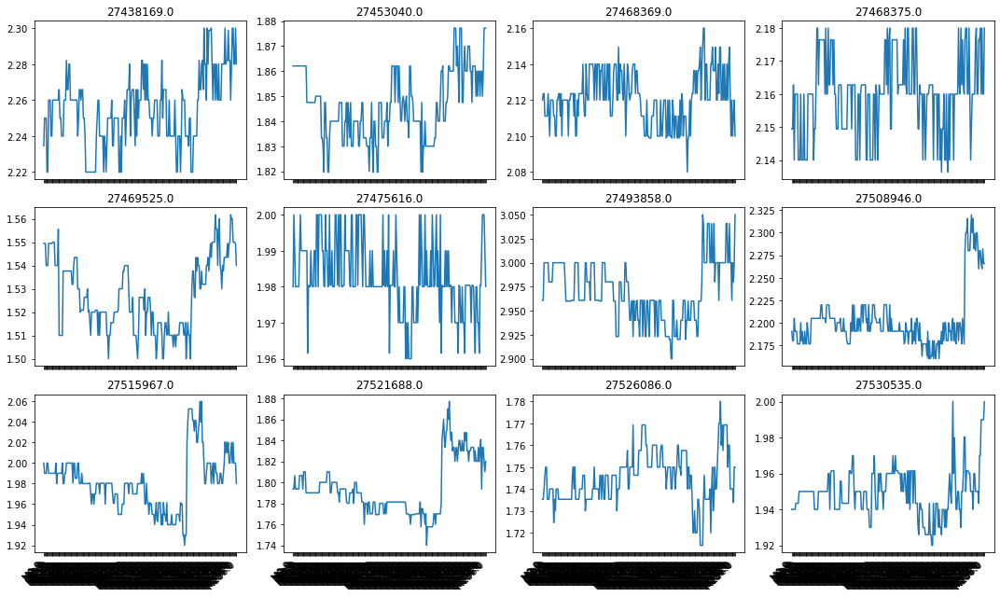

                          Cluster number: 1


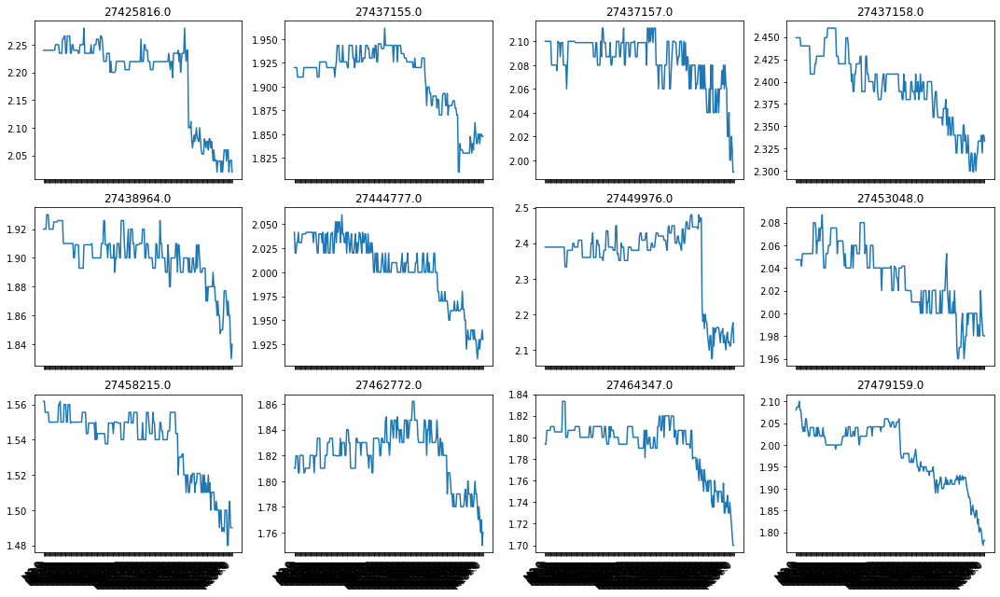

                          Cluster number: 2


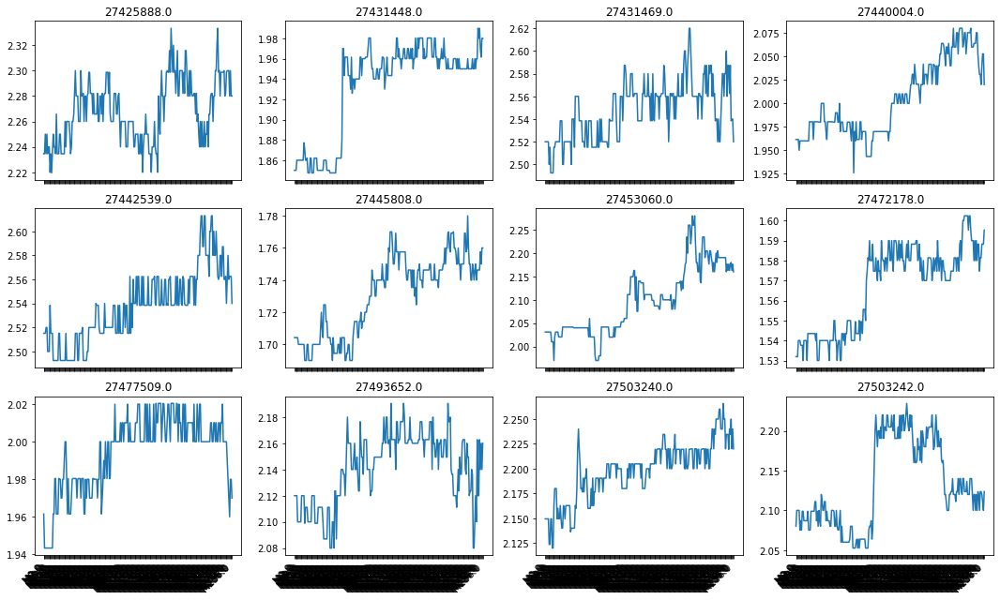

                          Cluster number: 3


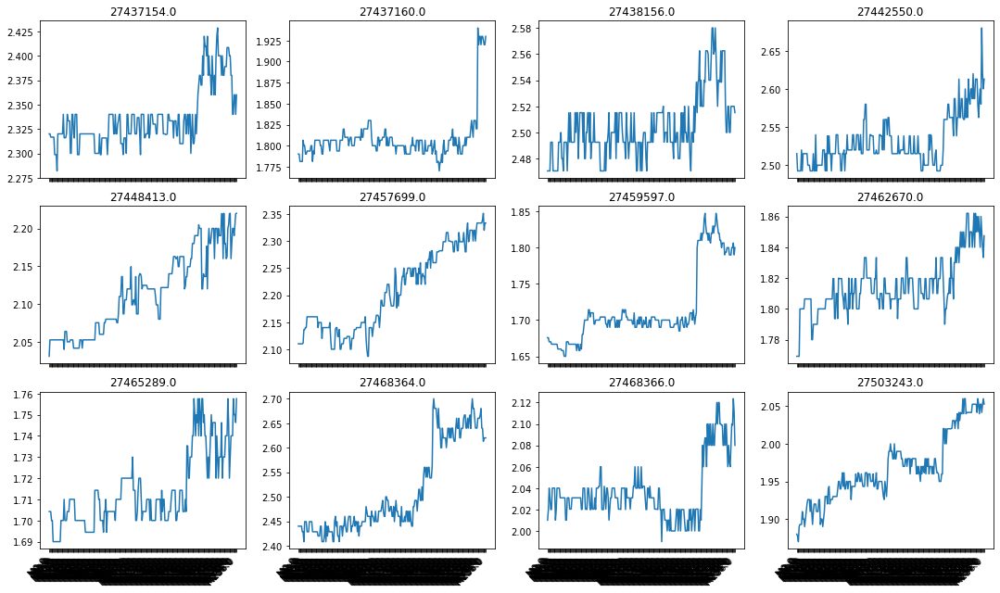

                          Cluster number: 4


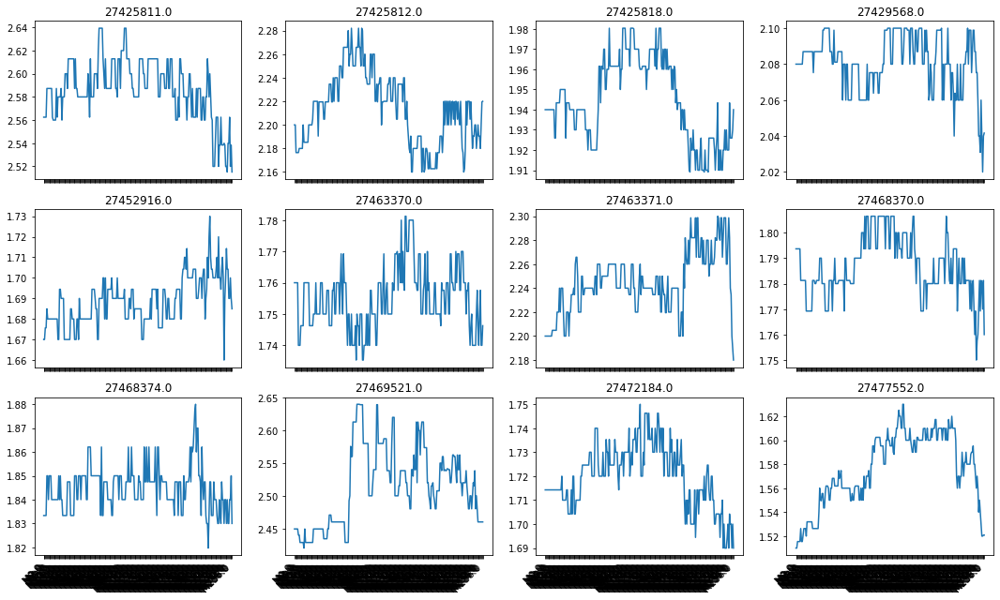

                          Cluster number: 5


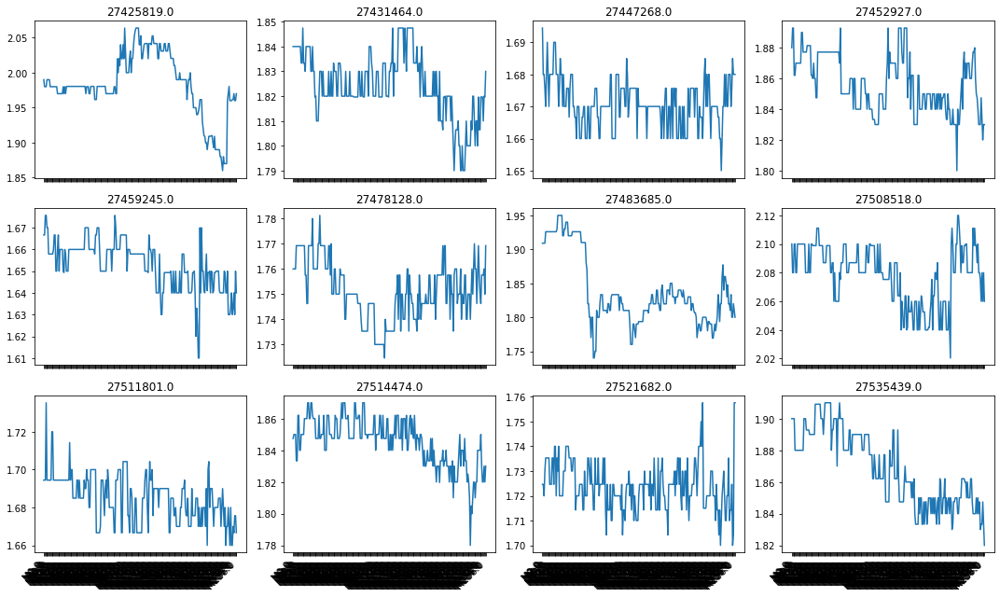

In [72]:
res0['cluster'] = ts_kmeans.predict(df_scaled)

for cluster in range(n_clusters):
    print("=================================================================================")
    print(f"                          Cluster number: {cluster}")
    print("=================================================================================")
    plot_cluster_tickers(res0[res0.cluster==cluster].head(12), TO0)

In [69]:
import pickle

with open("models/ts_kmeans_dtw.pickle", 'wb') as f:
    pickle.dump(ts_kmeans, f)